In [1]:
from functools import partial
import os

import torch.nn as nn
from torchvision.models import vit_b_16
import torch

import torchvision.transforms as transforms
from PIL import Image
from surgeon_pytorch import Extract, get_nodes

from lost import LOSTHeads

from sklearn.preprocessing import StandardScaler

import argparse

from wb_data import WaterBirdsDataset, get_loader, get_transform_cub, log_data
from utils import evaluate, get_y_p

from wb_data import WaterBirdsDataset, get_loader, get_transform_cub, log_data
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
import pickle

In [2]:
NUM_CLASSES = 2
model = vit_b_16(weights='DEFAULT')
model.heads.head = nn.Linear(model.heads.head.in_features, NUM_CLASSES)

In [3]:
#model.encoder.layers[11].ln_1
model.encoder.layers.encoder_layer_11.ln_1
#encoder.layers.11.layernorm2

LayerNorm((768,), eps=1e-06, elementwise_affine=True)

In [4]:
get_nodes(model)

['x',
 'getattr',
 'getitem',
 'getitem_1',
 'getitem_2',
 'getitem_3',
 'eq',
 '',
 'eq_1',
 '_assert',
 'floordiv',
 'floordiv_1',
 'conv_proj',
 'mul',
 'reshape',
 'permute',
 'getattr_1',
 'getitem_4',
 'expand',
 'cat',
 'encoder.dim',
 'encoder.eq',
 'encoder.getattr',
 'encoder._assert',
 'encoder.add',
 'encoder.dropout',
 'encoder.layers.encoder_layer_0.dim',
 'encoder.layers.encoder_layer_0.eq',
 'encoder.layers.encoder_layer_0.getattr',
 'encoder.layers.encoder_layer_0._assert',
 'encoder.layers.encoder_layer_0.ln_1',
 'encoder.layers.encoder_layer_0.self_attention',
 'encoder.layers.encoder_layer_0.getitem',
 'encoder.layers.encoder_layer_0.getitem_1',
 'encoder.layers.encoder_layer_0.dropout',
 'encoder.layers.encoder_layer_0.add',
 'encoder.layers.encoder_layer_0.ln_2',
 'encoder.layers.encoder_layer_0.mlp.0',
 'encoder.layers.encoder_layer_0.mlp.1',
 'encoder.layers.encoder_layer_0.mlp.2',
 'encoder.layers.encoder_layer_0.mlp.3',
 'encoder.layers.encoder_layer_0.mlp.4',

In [5]:
Extract(model, node_out="encoder.layers.encoder_layer_11.ln_1")

GraphModule(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Module(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Module(
      (encoder_layer_0): Module(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Module(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): Module(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAtten

In [6]:
import os
print(os.getcwd())
os.chdir("C:/Users/elmop/deep_feature_reweighting/deep_feature_reweighting")

C:\Users\elmop\deep_feature_reweighting\deep_feature_reweighting


In [7]:
model_orig = vit_b_16(weights='DEFAULT')
model_orig.heads.head = nn.Linear(model_orig.heads.head.in_features, NUM_CLASSES)
model_orig.load_state_dict(torch.load(
    "logs/vit_waterbirds.pth",map_location=torch.device('cpu')
    ))

C:\Users\elmop\AppData\Local\Temp\ipykernel_9492\694165624.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_orig.load_state_dict(torch.load(


<All keys matched successfully>

In [8]:
model2 = vit_b_16(weights='DEFAULT')
model2.heads.head = nn.Linear(model2.heads.head.in_features, NUM_CLASSES)
model2.load_state_dict(torch.load(
    "logs/dfr_model.pth",map_location=torch.device('cpu')
    ))

C:\Users\elmop\AppData\Local\Temp\ipykernel_9492\2038915333.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model2.load_state_dict(torch.load(


<All keys matched successfully>

In [9]:
model2.eval()

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [10]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [11]:
def denormalize_image(image_tensor):
    # The inverse of the normalization step
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image_tensor = image_tensor * std + mean
    return image_tensor

In [12]:
def tensorize(img_path):
    root = 'notebooks/data/'
    image = Image.open(root+img_path).convert('RGB')
    return preprocess(image)

#image_tensor = scaler.fit_transform()



In [13]:
lost = LOSTHeads(model)

12


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6006702e-09..1.0].

-6.6006702326149025e-09 1.0


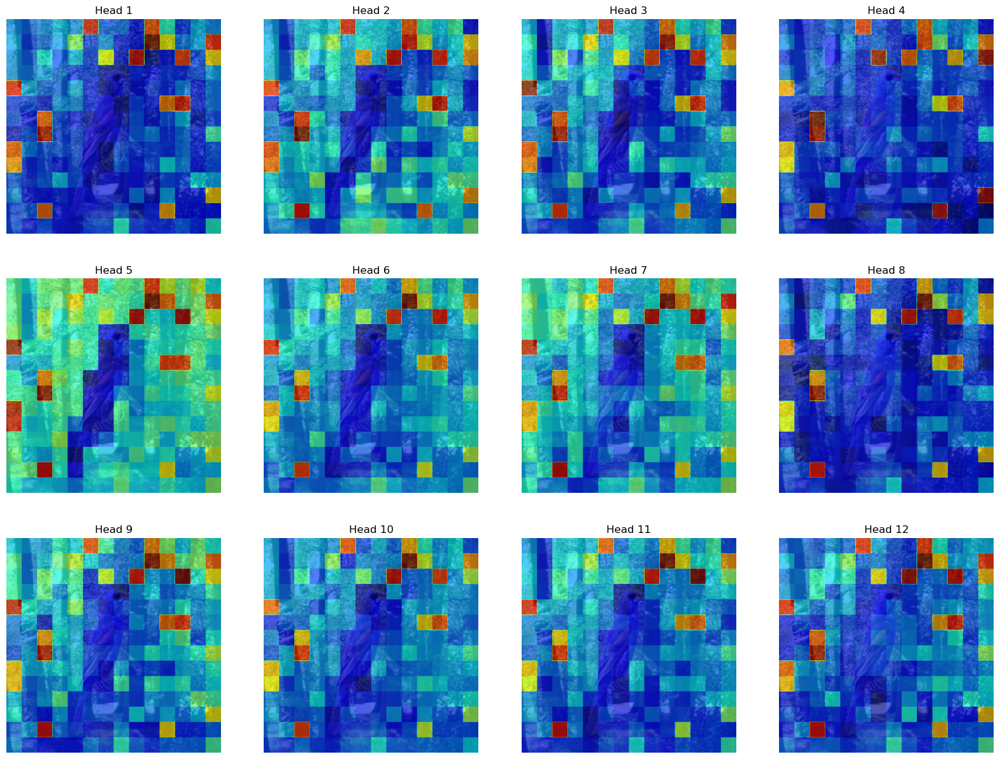

[array([[ -6.1132803 ,  -8.007365  ,  -6.524095  ,  -3.5154254 ,
          -5.8833766 ,  22.231762  ,  -8.50118   ,  -8.099159  ,
         -12.306377  ,  18.900995  ,  -0.03750467,  -9.977951  ,
          -4.121852  ,  -6.0070043 ],
        [ -4.385264  ,  -9.733967  ,  -7.8439035 ,  -4.7051744 ,
           5.1025577 ,  -9.619656  ,  -5.8400354 , -11.324261  ,
         -12.326985  ,  25.45843   ,  10.804919  ,  -6.695964  ,
          -4.26303   ,  20.434462  ],
        [ -5.9283667 ,  -8.215234  ,  -2.0085113 ,  -8.455324  ,
          -3.9164593 , -10.160035  ,  10.173572  , -12.949814  ,
          22.563896  , -15.874164  , -12.437573  ,  19.157011  ,
          -8.978775  ,  11.854527  ],
        [ -6.166792  ,  -6.7687306 ,  -5.082382  ,  -7.6991177 ,
          -9.9733515 ,  -9.957135  , -14.80689   , -15.58464   ,
         -10.858373  , -12.545532  , -10.187289  , -10.722698  ,
          -9.332919  ,  -4.8587437 ],
        [ 21.411236  ,  -4.7247887 ,  -8.429978  ,  -8.019397  ,
   

In [14]:
lost.generate_and_visualize(tensorize('054.Blue_Grosbeak/Blue_Grosbeak_0038_37095.jpg'))

1.5610339687555097e-09 1.0


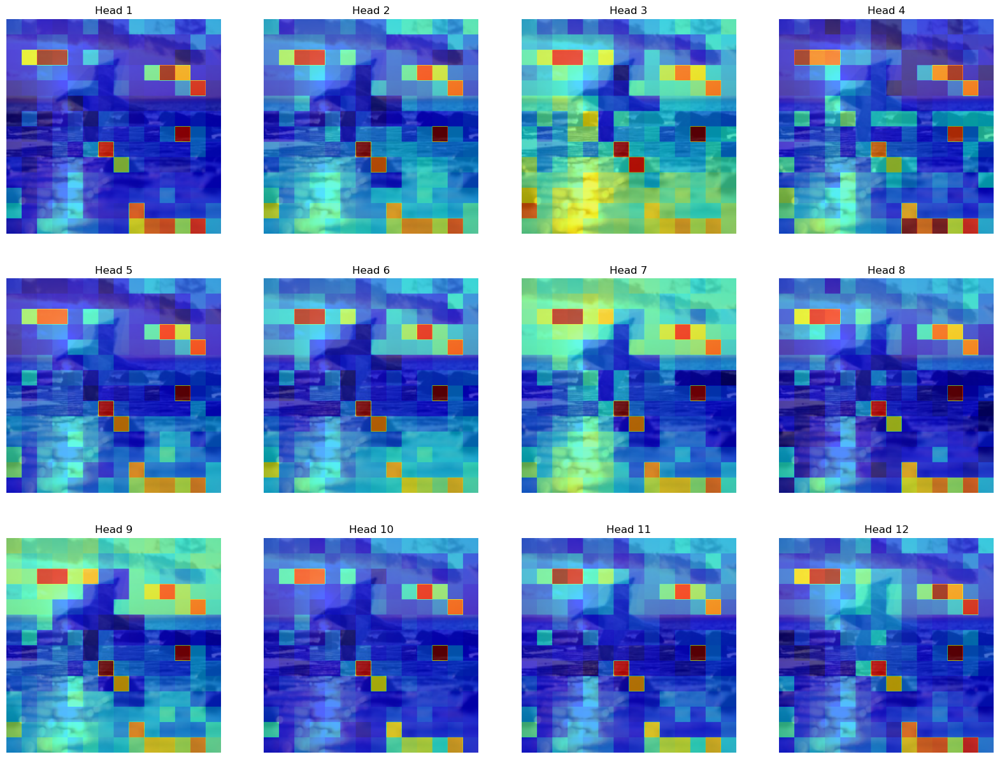

[array([[ -6.6323695 ,  -8.544221  ,  -9.605744  , -10.672668  ,
          -8.615311  ,  -5.258568  , -11.959182  ,  -8.513693  ,
          -2.7184298 ,  -3.9605865 ,  -3.8395813 ,  -8.490002  ,
          -8.855955  ,  -2.9428174 ],
        [ -9.132159  ,  -9.316922  ,  -7.264147  ,  -6.5866055 ,
          -8.997623  ,  -9.797776  , -11.510201  , -11.259168  ,
         -10.19999   , -11.140847  , -11.191449  , -10.865721  ,
          -4.934614  ,  -8.114624  ],
        [ -9.931215  ,  10.687405  ,  25.150944  ,  24.404123  ,
          -8.93982   ,  -1.9494282 ,  -7.1254606 , -10.358294  ,
         -10.950521  , -10.912783  , -10.978184  , -14.443109  ,
         -11.64409   , -10.175203  ],
        [-10.041451  , -10.21002   ,  -6.2122693 ,  -7.3036733 ,
         -10.753477  , -10.692485  , -10.105136  ,  -8.528245  ,
          -9.335098  ,   3.3337102 ,  24.923592  ,  14.197486  ,
          -9.451119  , -10.731977  ],
        [-12.066345  , -11.348707  , -10.401539  , -10.158702  ,
   

In [15]:
lost.generate_and_visualize(tensorize('001.Black_footed_Albatross/Black_Footed_Albatross_0010_796097.jpg'))


6.923361439703513e-09 1.0


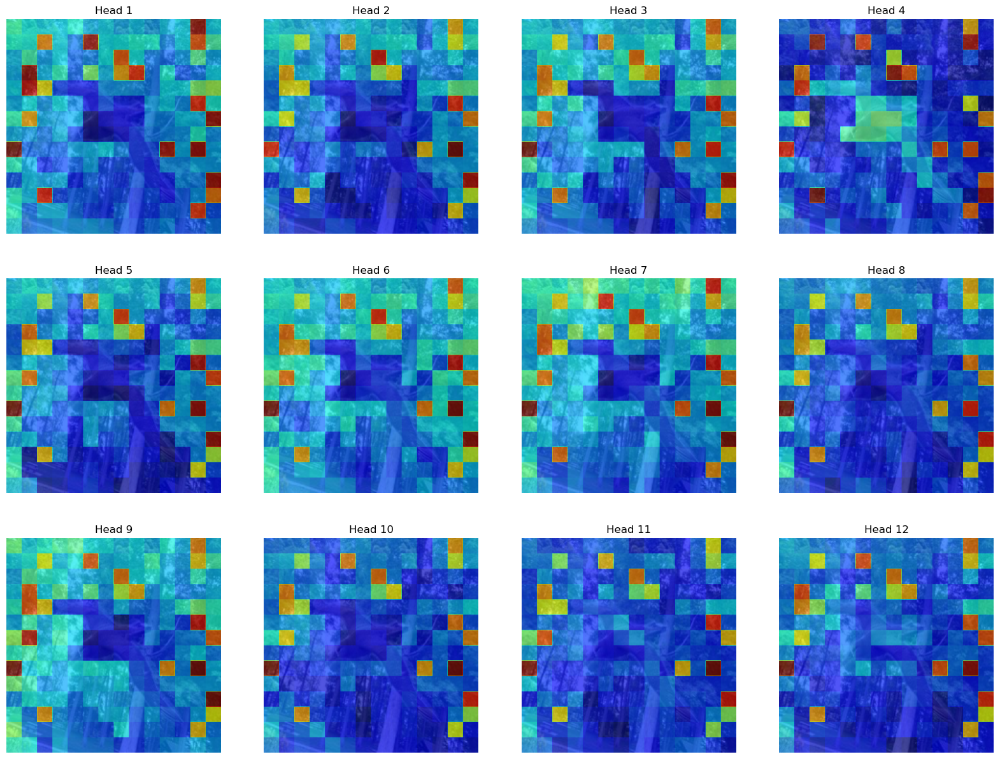

[array([[ -2.525189  ,  -5.328071  ,  -6.078465  ,  -5.7950873 ,
          -4.095875  ,  -7.669959  ,  -6.4706364 ,  -8.719014  ,
          -7.094804  ,  -9.5385    ,  -7.047643  ,  -5.9494133 ,
          23.168222  ,  -6.5281897 ],
        [ -4.073076  ,  -4.5974207 ,  14.544762  ,  -6.0029354 ,
         -10.382796  ,  22.86987   ,  -5.672222  ,  -5.1302934 ,
          -4.0404806 ,  -4.684557  ,  -9.607882  ,  -5.6472845 ,
          16.797705  ,  -1.3553324 ],
        [ -7.607114  ,  -1.6710111 ,  -8.504613  ,  -5.7912803 ,
         -11.375111  , -10.263966  ,  -5.342515  ,  16.84224   ,
          -4.919141  , -10.183934  , -11.166283  ,  -8.369706  ,
          -0.29172266,  -7.8209577 ],
        [ -7.7471647 ,  23.609423  ,  -7.303202  ,  -2.9769537 ,
         -11.6638975 ,   2.0702305 ,  -7.7642403 ,  12.922356  ,
          19.364216  , -10.780012  ,  -4.3036904 , -11.970241  ,
         -10.801155  ,  -5.979903  ],
        [ -5.7008033 ,  21.213465  ,   9.315766  , -13.166316  ,
   

In [16]:
lost.generate_and_visualize(tensorize('001.Black_footed_Albatross/Black_Footed_Albatross_0001_796111.jpg'))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.637698e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.637698e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.637698e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.637698e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.637698e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.637698e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integer

-1.6376979772303457e-09 0.9999999403953552


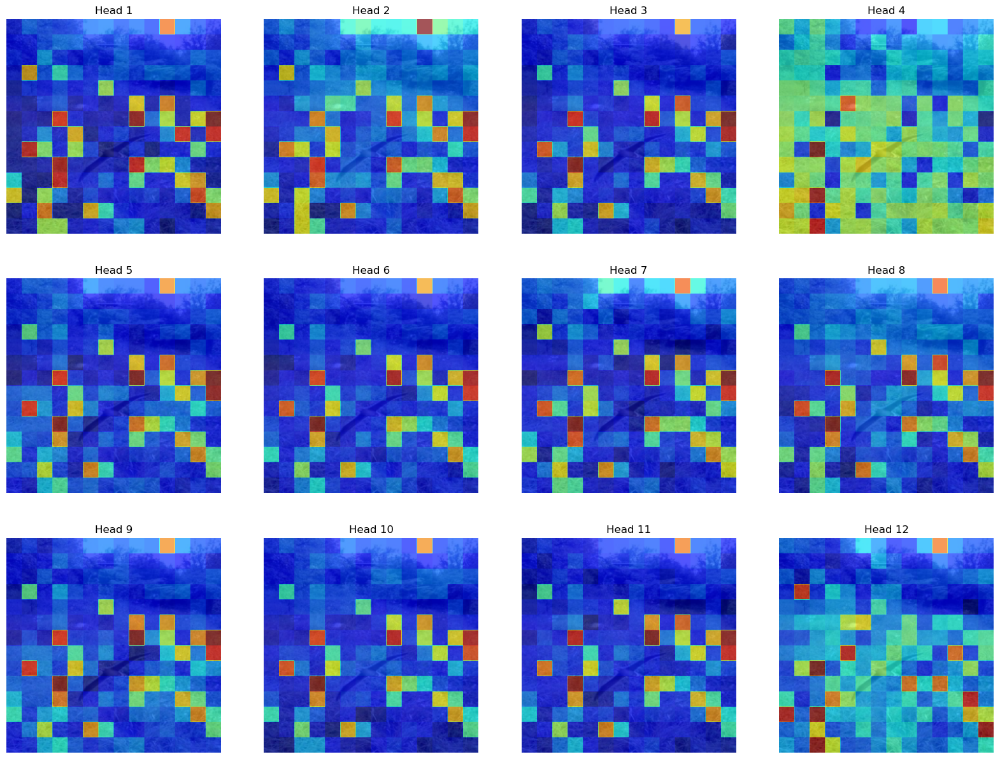

[array([[ -9.227544 ,  -4.1048694,  -5.2890186,  -5.901781 ,  -5.547186 ,
          -3.5248218,  -2.899045 ,  -4.863806 ,  -3.702853 ,  -5.7523417,
          20.571365 ,  -2.3014002,  -5.227651 ,  -7.246279 ],
        [ -7.739039 ,  -7.4095187,  -5.1413293,  -3.194682 ,  -3.4143717,
          -5.986105 ,  -6.0192857,  -4.5163493,  -7.8243637,  -6.8255   ,
          -7.3966837,  -8.0353   ,  -7.6519675,  -9.565004 ],
        [ -6.926265 ,  -8.495422 ,  -0.8661912,  -6.193339 ,  -8.934828 ,
          -6.034158 ,  -7.0741534,  -3.860995 ,  -5.301856 ,  -6.553431 ,
          -6.0650597,  -5.716051 ,  -3.5302975,  -4.925495 ],
        [ -9.452566 ,  17.670218 ,  -4.759607 ,   4.365112 ,  -3.5042295,
          -6.97996  ,  -4.8205905,  -3.9020472,  -5.8490124,  -3.3279111,
          -3.3567495,  -3.9151077,  -6.6169877,  -4.74622  ],
        [-11.426339 ,  -6.8368964,  -8.355886 ,  -5.437733 ,  -8.236977 ,
          -6.782368 ,  10.6489935,  -6.936801 ,  -7.770107 ,  -7.708813 ,
          -9

In [17]:
lost.generate_and_visualize(tensorize('001.Black_footed_Albatross/Black_Footed_Albatross_0078_796126.jpg'))



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8793644e-09..1.0].

-3.879364385284134e-09 1.0


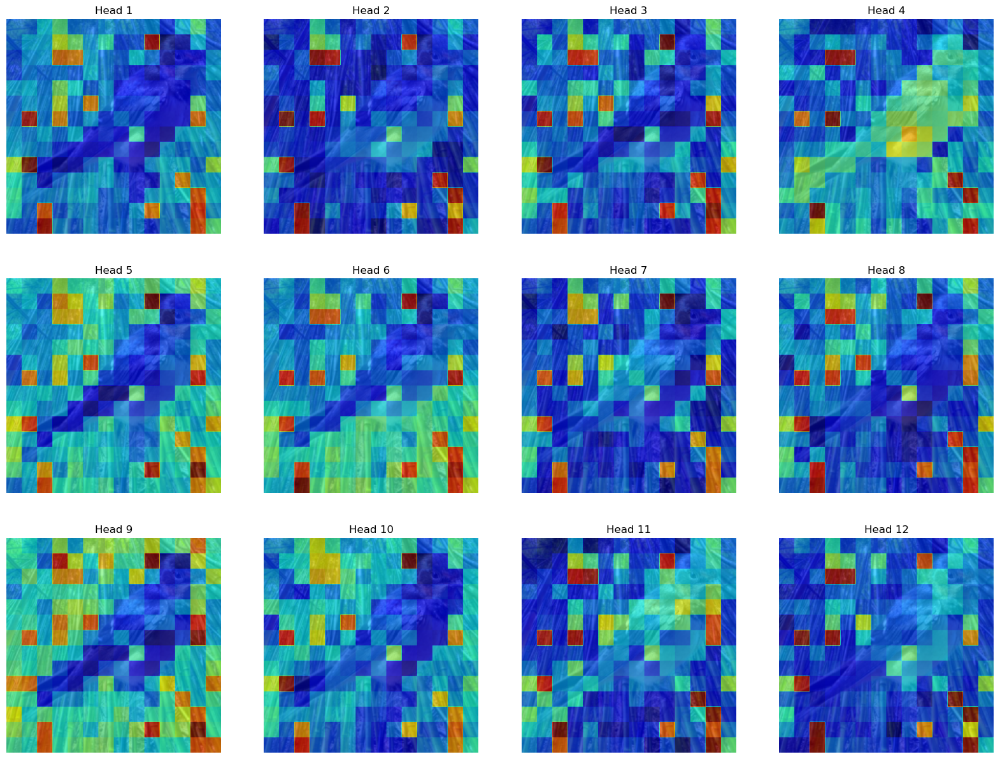

[array([[ -7.6356177 ,  -7.8906856 ,  -4.2971992 ,  -0.29670906,
          -7.2218328 ,  -7.268962  ,  -6.083438  ,  -6.7815337 ,
          -6.848858  ,  -6.0581155 ,  -9.664978  ,  -4.880754  ,
          -0.56017196,  -8.565674  ],
        [ -7.7626204 ,  -5.22233   ,  -5.000359  ,   4.0925384 ,
           0.66471857,  -5.9961514 ,  -2.2469833 ,  -9.015104  ,
          -8.421475  ,  13.947011  , -14.556507  , -13.406931  ,
          -4.542221  ,  -8.745446  ],
        [ -9.030172  ,  -5.7186294 ,  -5.4496846 ,   9.278893  ,
           8.695774  ,  -5.24699   ,  -6.994586  ,  -8.003458  ,
          -3.985847  ,  -6.9923296 , -13.378295  , -11.334058  ,
         -10.906076  ,  -5.9772716 ],
        [ -9.085843  ,  -6.6372013 ,  -7.5073934 ,  -6.9443517 ,
          -8.221442  ,  -4.5836687 ,  -7.0302534 ,  -9.06699   ,
         -11.056581  , -13.229145  , -11.229193  ,  -9.016233  ,
          -8.953917  ,  -4.894397  ],
        [ -5.281248  ,  -4.4213133 ,  -6.8501697 ,   1.0927744 ,
   

In [18]:
lost.generate_and_visualize(tensorize('136.Barn_Swallow/Barn_Swallow_0002_130551.jpg'))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2148364e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2148364e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2148364e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2148364e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2148364e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2148364e-09..0.99999994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for i

-3.214836397091858e-09 0.9999999403953552


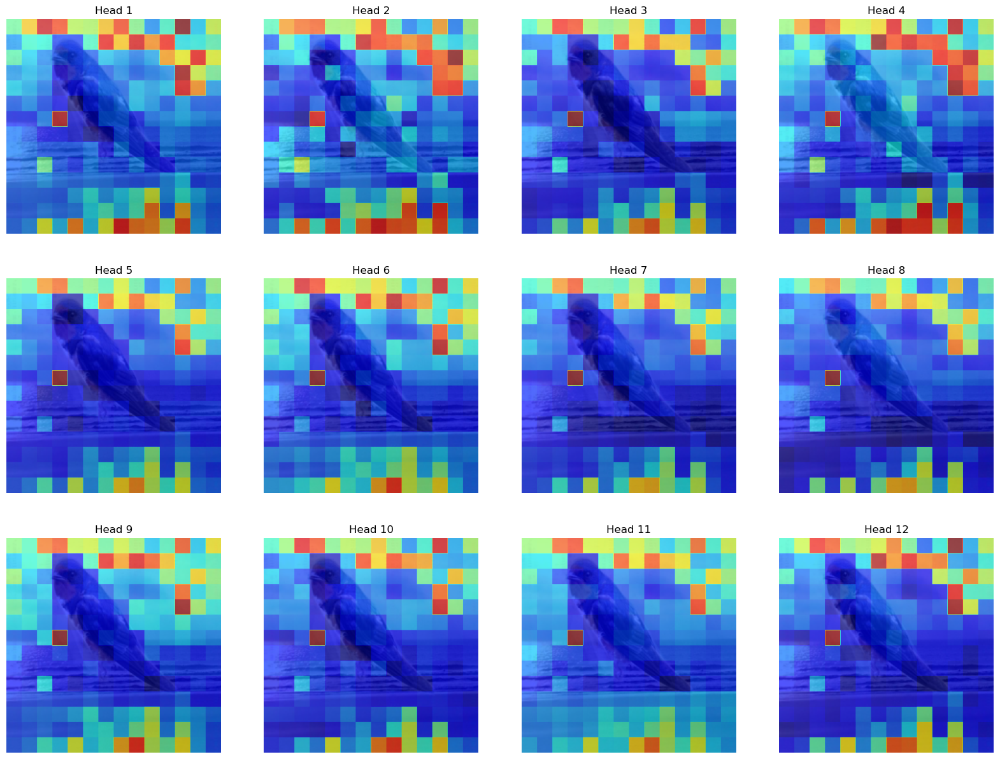

[array([[  1.7629879 ,  11.839171  ,  22.236975  ,  18.802433  ,
           6.1781387 ,   5.4647417 ,  12.201716  ,  18.891266  ,
           2.6944563 ,  -8.072926  ,  -1.2018235 ,  25.390703  ,
          -4.862535  ,   7.07873   ],
        [ -7.4507494 ,  -1.5421578 ,  -2.4226384 , -12.032774  ,
         -12.140354  ,  -0.98923624,  21.07624   ,  11.775747  ,
          21.86926   ,  14.853326  ,  20.412407  ,  -3.5692325 ,
          -2.9807844 ,  -0.07520714],
        [  0.11115281,  -4.6691284 ,  -8.415673  , -10.915137  ,
         -11.947082  , -10.644599  ,  -5.259846  ,  -6.586711  ,
          -8.65502   ,  -6.5052395 ,  13.847321  ,   9.29309   ,
          20.878325  ,   8.61067   ],
        [ -7.1609573 ,  -5.2835    ,  -7.256501  , -14.413481  ,
         -12.425629  , -11.310055  , -10.301179  ,  -7.807682  ,
         -10.086767  ,  -8.656662  ,  -7.62404   ,  24.200943  ,
           7.2180467 ,   1.5460188 ],
        [ -4.3010287 ,  -6.1047735 ,  -8.834174  , -16.224276  ,
   

In [19]:
lost.generate_and_visualize(tensorize('136.Barn_Swallow/Barn_Swallow_0052_131539.jpg'))
